In [70]:
# import required packages
import pandas as pd
import plotly.express as px
import matplotlib.pyplot as plt
import seaborn as sns; sns.set(style="ticks", color_codes=True)
import geopandas as gpd

In [104]:
# load data
df = pd.read_csv('monthly_avg_irradianciaFrom2012.csv', parse_dates=['YearMonth'])     
df.head()

,departamento,YearMonth,Avg_Irradiancia,AREA,PERIMETER,HECTARES,geometry,point,long,lat,sz,regiones,capital
0,atlantico,2012-12-01,504.956049,3.360765e+09,240936.172,336076.535,POLYGON ((-74.87059783939971 10.36120033256951...,POINT (-74.98257617711538 10.664319675515648),-74.982576,10.66432,0.5,caribe,barranquilla
1,atlantico,2013-01-01,545.911659,3.360765e+09,240936.172,336076.535,POLYGON ((-74.87059783939971 10.36120033256951...,POINT (-74.98257617711538 10.664319675515648),-74.982576,10.66432,0.5,caribe,barranquilla
2,atlantico,2013-02-01,508.877759,3.360765e+09,240936.172,336076.535,POLYGON ((-74.87059783939971 10.36120033256951...,POINT (-74.98257617711538 10.664319675515648),-74.982576,10.66432,0.5,caribe,barranquilla
3,atlantico,2013-03-01,473.020884,3.360765e+09,240936.172,336076.535,POLYGON ((-74.87059783939971 10.36120033256951...,POINT (-74.98257617711538 10.664319675515648),-74.982576,10.66432,0.5,caribe,barranquilla
4,atlantico,2013-04-01,470.628967,3.360765e+09,240936.172,336076.535,POLYGON ((-74.87059783939971 10.36120033256951...,POINT (-74.98257617711538 10.664319675515648),-74.982576,10.66432,0.5,caribe,barranquilla


In [105]:
df.shape

(547, 13)

In [73]:
my_token = 'your token'
px.set_mapbox_access_token(my_token)

In [106]:

# Convert 'YearMonth' to datetime if it's not already
df['YearMonth'] = pd.to_datetime(df['YearMonth'])

# Ensure all departamentos have all YearMonth values
departamentos = df['departamento'].unique()
all_months = pd.date_range(start=df['YearMonth'].min(), end=df['YearMonth'].max(), freq='MS')

# Create a DataFrame with all combinations of departamentos and YearMonth
template = pd.DataFrame([(d, m) for d in departamentos for m in all_months], columns=['departamento', 'YearMonth'])

# Merge with original DataFrame to fill missing entries
merged_df = template.merge(df, on=['departamento', 'YearMonth'], how='left')

# Calculate historical mean for each departamento
historical_means = df.groupby('departamento')['Avg_Irradiancia'].mean().reset_index()

# Function to validate continuity and fill missing values
def validate_and_fill_missing(df):
    missing_months = {}
    for depto in departamentos:
        depto_df = df[df['departamento'] == depto].copy()
        # Check for missing YearMonth values
        expected_months = set(all_months)
        actual_months = set(depto_df['YearMonth'])
        missing_months[depto] = list(expected_months - actual_months)
        if missing_months[depto]:
            print(f"Missing months to impute for {depto}: {', '.join([str(month.strftime('%Y-%m-%d')) for month in missing_months[depto]])}")
        # Fill missing Avg_Irradiancia values with historical mean
        depto_mean = historical_means.loc[historical_means['departamento'] == depto, 'Avg_Irradiancia'].values[0]
        depto_df['Avg_Irradiancia'].fillna(depto_mean, inplace=True)
        # Update merged_df with filled values
        df.loc[df['departamento'] == depto] = depto_df
    return df

# Validate continuity and fill missing values
final_df = validate_and_fill_missing(merged_df)

# Check for any missing months in final_df (for verification)
missing_check = final_df.groupby('departamento')['YearMonth'].apply(lambda x: all_months.difference(x))
missing_check = missing_check[missing_check.apply(len) > 0]

if not missing_check.empty:
    print("Missing months after validation:")
    for depto, missing_months in missing_check.items():
        print(f"{depto}: {', '.join(m.strftime('%Y-%m-%d') for m in missing_months)}")
else:
    print("No missing months found after validation.")

# Print final DataFrame to verify
print("\nFinal DataFrame:")
print(final_df)


No missing months found after validation.

Final DataFrame:
    departamento  YearMonth  Avg_Irradiancia  AREA  PERIMETER  HECTARES  \
0      atlantico 2012-01-01       389.734290   NaN        NaN       NaN   
1      atlantico 2012-02-01       389.734290   NaN        NaN       NaN   
2      atlantico 2012-03-01       389.734290   NaN        NaN       NaN   
3      atlantico 2012-04-01       389.734290   NaN        NaN       NaN   
4      atlantico 2012-05-01       389.734290   NaN        NaN       NaN   
..           ...        ...              ...   ...        ...       ...   
905        sucre 2022-06-01       348.782906   NaN        NaN       NaN   
906        sucre 2022-07-01       348.782906   NaN        NaN       NaN   
907        sucre 2022-08-01       348.782906   NaN        NaN       NaN   
908        sucre 2022-09-01       348.782906   NaN        NaN       NaN   
909        sucre 2022-10-01       348.782906   NaN        NaN       NaN   

    geometry point  long  lat  sz regio

/var/folders/_8/stsrqpjs1q1559jp3dtpqv0c0000gn/T/ipykernel_27212/720233931.py:30: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/var/folders/_8/stsrqpjs1q1559jp3dtpqv0c0000gn/T/ipykernel_27212/720233931.py:30: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing '

## Exploration 

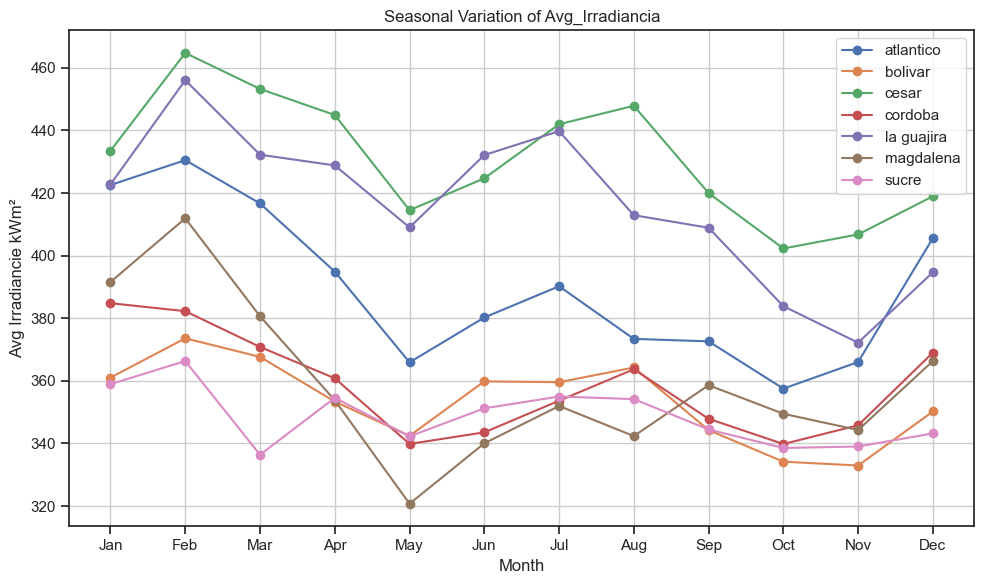

In [107]:
# Extract month and year for grouping
final_df['Month'] = final_df['YearMonth'].dt.month
final_df['Year'] = final_df['YearMonth'].dt.year

# Calculate mean Avg_Irradiancia by Month and departamento
mean_irradiancia_seasonal = final_df.groupby(['departamento', 'Month'])['Avg_Irradiancia'].mean().reset_index()

# Plot seasonal variation for each departamento
plt.figure(figsize=(10, 6))
for departamento in mean_irradiancia_seasonal['departamento'].unique():
    departamento_data = mean_irradiancia_seasonal[mean_irradiancia_seasonal['departamento'] == departamento]
    plt.plot(departamento_data['Month'], departamento_data['Avg_Irradiancia'], marker='o', label=departamento)

plt.title('Seasonal Variation of Avg_Irradiancia')
plt.xlabel('Month')
plt.ylabel('Avg Irradiancie kWm²')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [108]:
# Define month names
months = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

# Map month numbers to month names
final_df['Months'] = final_df['Month'].apply(lambda x: months[int(x)-1])

In [109]:
final_df.head()

,departamento,YearMonth,Avg_Irradiancia,AREA,PERIMETER,HECTARES,geometry,point,long,lat,sz,regiones,capital,Month,Year,Months
0,atlantico,2012-01-01,389.73429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2012,Jan
1,atlantico,2012-02-01,389.73429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2,2012,Feb
2,atlantico,2012-03-01,389.73429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3,2012,Mar
3,atlantico,2012-04-01,389.73429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4,2012,Apr
4,atlantico,2012-05-01,389.73429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,2012,May


## Reading the Shapefile

In [6]:
caribe_geojson = gpd.read_file("colombia.geo.json")
caribe_geojson.head()

,DPTO,NOMBRE_DPT,AREA,PERIMETER,HECTARES,geometry
0,05,ANTIOQUIA,6.335186e+10,1963728.843,6335185.555,"POLYGON ((-76.30730 8.61930, -76.29810 8.61640..."
1,08,ATLANTICO,3.360765e+09,240936.172,336076.535,"POLYGON ((-74.87060 10.36120, -74.87640 10.343..."
2,11,SANTAFE DE BOGOTA D.C,1.650948e+09,323322.540,165094.778,"POLYGON ((-74.02290 4.79510, -74.02640 4.78360..."
3,13,BOLIVAR,2.614189e+10,1309427.968,2614189.453,"POLYGON ((-75.15950 10.42360, -75.15430 10.409..."
4,15,BOYACA,2.335258e+10,1364539.911,2335258.246,"POLYGON ((-72.21300 7.02750, -72.20610 7.02460..."


<Axes: >

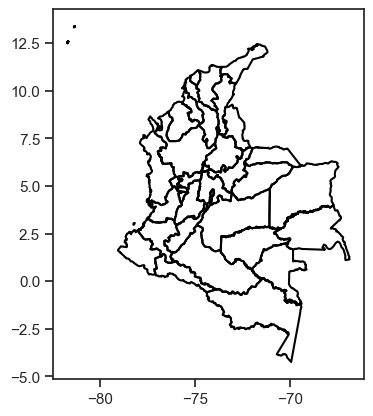

In [7]:
caribe_geojson.boundary.plot(edgecolor = 'black')

In [8]:
#funtion to make match with departamento
def matchDepartment(x):
    if x=='atlantico' :
        return 'barranquilla'
    elif x== 'bolivar':
        return 'cartagena'
    elif x== 'cesar':
        return 'valledupar'         
    elif x== 'la guajira':
        return 'riohacha'
    elif x=='cordoba':
        return 'monteria'
    elif x=='sucre':
        return 'sincelejo'
    elif x=='magdalena':
        return 'santa marta'
    else:
        return 'no_caribe'

In [9]:
caribe_geojson['NOMBRE_DPT'] = caribe_geojson['NOMBRE_DPT'].apply(lambda x: x.lower() if isinstance(x, str) else x)
caribe_geojson['capital'] = caribe_geojson['NOMBRE_DPT'].apply(matchDepartment)
caribe_geojson.head()

,DPTO,NOMBRE_DPT,AREA,PERIMETER,HECTARES,geometry,capital
0,05,antioquia,6.335186e+10,1963728.843,6335185.555,"POLYGON ((-76.30730 8.61930, -76.29810 8.61640...",no_caribe
1,08,atlantico,3.360765e+09,240936.172,336076.535,"POLYGON ((-74.87060 10.36120, -74.87640 10.343...",barranquilla
2,11,santafe de bogota d.c,1.650948e+09,323322.540,165094.778,"POLYGON ((-74.02290 4.79510, -74.02640 4.78360...",no_caribe
3,13,bolivar,2.614189e+10,1309427.968,2614189.453,"POLYGON ((-75.15950 10.42360, -75.15430 10.409...",cartagena
4,15,boyaca,2.335258e+10,1364539.911,2335258.246,"POLYGON ((-72.21300 7.02750, -72.20610 7.02460...",no_caribe


In [10]:
caribe_geojson.capital.unique()

array(['no_caribe', 'barranquilla', 'cartagena', 'valledupar', 'monteria',
       'riohacha', 'santa marta', 'sincelejo'], dtype=object)

## Filtering the Colombian Caribbean Region

<Axes: >

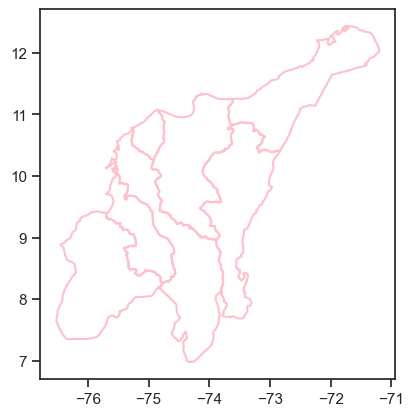

In [11]:
caribe_geojson_ready =  caribe_geojson[caribe_geojson['capital']!= 'no_caribe']
caribe_geojson_ready.boundary.plot(edgecolor='pink')

In [12]:
caribe_geojson_ready.head()

,DPTO,NOMBRE_DPT,AREA,PERIMETER,HECTARES,geometry,capital
1,08,atlantico,3.360765e+09,240936.172,336076.535,"POLYGON ((-74.87060 10.36120, -74.87640 10.343...",barranquilla
3,13,bolivar,2.614189e+10,1309427.968,2614189.453,"POLYGON ((-75.15950 10.42360, -75.15430 10.409...",cartagena
8,20,cesar,2.297310e+10,1080343.678,2297309.568,"POLYGON ((-73.28232 10.85625, -73.28062 10.838...",valledupar
9,23,cordoba,2.505949e+10,814093.372,2505948.561,"POLYGON ((-75.81950 9.42300, -75.80910 9.41950...",monteria
13,44,la guajira,2.101235e+10,936598.020,2101234.966,"POLYGON ((-71.62120 12.42350, -71.59810 12.417...",riohacha


In [13]:
caribe_geojson_ready =  caribe_geojson_ready.rename(columns={'NOMBRE_DPT':'departamento'})
caribe_geojson_ready.head()

,DPTO,departamento,AREA,PERIMETER,HECTARES,geometry,capital
1,08,atlantico,3.360765e+09,240936.172,336076.535,"POLYGON ((-74.87060 10.36120, -74.87640 10.343...",barranquilla
3,13,bolivar,2.614189e+10,1309427.968,2614189.453,"POLYGON ((-75.15950 10.42360, -75.15430 10.409...",cartagena
8,20,cesar,2.297310e+10,1080343.678,2297309.568,"POLYGON ((-73.28232 10.85625, -73.28062 10.838...",valledupar
9,23,cordoba,2.505949e+10,814093.372,2505948.561,"POLYGON ((-75.81950 9.42300, -75.80910 9.41950...",monteria
13,44,la guajira,2.101235e+10,936598.020,2101234.966,"POLYGON ((-71.62120 12.42350, -71.59810 12.417...",riohacha


In [58]:
final_df = final_df.rename(columns={'Avg_Irradiancia':'Avg Irradiance kWm²'})

## Creating the Animations

In [65]:
final_df['Months'] = final_df['Months'].astype(str)

fig = px.choropleth_mapbox(final_df,
                           geojson=caribe_geojson_ready,
                           featureidkey='properties.departamento',
                           locations='departamento',
                           color='Avg Irradiance kWm²',
                           hover_name='departamento',
                           hover_data=['Avg Irradiance kWm²'],
                           color_continuous_scale='Reds',
                           animation_frame='Months',
                           #mapbox_style='carto-positron',
                           mapbox_style="white-bg",
                           title="Monthly Variation of Irradiance Across Departamentos",
                           center={'lat':10, 'lon':-74},
                           zoom=7,
                           opacity=0.75,
                           labels={'Count':'Count'},
                           width=1100,
                           height=800,
                           #labels={"Avg_Irradiancia": "Avg Irradiance kWm²"}
                          )

fig.show()

In [69]:
final_df['Year'] = final_df['Year'].astype(str)

fig = px.choropleth_mapbox(final_df,
                           geojson=caribe_geojson_ready,
                           featureidkey='properties.departamento',
                           locations='departamento',
                           color='Avg Irradiance kWm²',
                           hover_name='departamento',
                           hover_data=['Avg Irradiance kWm²'],
                           color_continuous_scale='Reds',
                           animation_frame='Year',
                           mapbox_style='carto-positron',
                           #mapbox_style="white-bg",
                           title="Temporal Analysis of Average Irradiance in Colombia's Caribbean Region (2012-2022)",
                           center={'lat':10, 'lon':-74},
                           zoom=5,
                           opacity=0.75,
                           labels={'Count':'Count'},
                           width=1100,
                           height=800,
                           #labels={"Avg_Irradiancia": "Avg Irradiance kWm²"}
                          )

fig.show()